# Face Generation

In this project, you'll define and train a Generative Adverserial network of your own creation on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **defining new architectures training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset has higher resolution images than datasets you have previously worked with (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed-celeba-small/`.

In [1]:
# # run this once to unzip the file
# do not need to run if the folder is unziped
# !unzip processed-celeba-small.zip

Archive:  processed-celeba-small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

In [1]:
# need newer version of torch and torchvision to use io.read_image
# after install need to restart the kernel
!pip install torch==1.12.1 torchvision==0.13.1

Defaulting to user installation because normal site-packages is not writeable
     |████████████████████████████████| 776.3 MB 8.1 kB/s  eta 0:00:01
     |████████████████████████████████| 19.1 MB 35.0 MB/s eta 0:00:01
ERROR: torchtext 0.12.0 has requirement torch==1.11.0, but you'll have torch 1.12.1 which is incompatible.
  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [1]:
from glob import glob
import os
from typing import Tuple, Callable, Dict
import pickle as pkl

import matplotlib.pyplot as plt
import numpy as np
import torch
from PIL import Image
from torch.utils.data import DataLoader, Dataset
from torchvision.transforms import Compose, ToTensor, Resize, Normalize, ToPILImage
from torchvision import datasets
from torchvision.io import read_image

import tests

In [2]:
data_dir = 'processed_celeba_small/celeba/'

## Data pipeline

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA dataset and contains roughly 30,000 images. 

Your first task consists in building the dataloader. To do so, you need to do the following:
* implement the get_transforms function
* create a custom Dataset class that reads the CelebA data

### Exercise: implement the get_transforms function

The `get_transforms` function should output a [`torchvision.transforms.Compose`](https://pytorch.org/vision/stable/generated/torchvision.transforms.Compose.html#torchvision.transforms.Compose) of different transformations. You have two constraints:
* the function takes a tuple of size as input and should **resize the images** to the input size
* the output images should have values **ranging from -1 to 1**

In [3]:
def get_transforms(size: Tuple[int, int]) -> Callable:
    """ Transforms to apply to the image."""
    # TODO: edit this function by appening transforms to the below list
    transforms = [ToPILImage(),
                  Resize(size),
                  ToTensor(),
                  Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])]
    
    return Compose(transforms)

### Exercise: implement the DatasetDirectory class


The `DatasetDirectory` class is a torch Dataset that reads from the above data directory. The `__getitem__` method should output a transformed tensor and the `__len__` method should output the number of files in our dataset. You can look at [this custom dataset](https://pytorch.org/tutorials/beginner/basics/data_tutorial.html#creating-a-custom-dataset-for-your-files) for ideas. 

In [4]:
class DatasetDirectory(Dataset):
    """
    A custom dataset class that loads images from folder.
    args:
    - directory: location of the images
    - transform: transform function to apply to the images
    - extension: file format
    """
    def __init__(self, 
                 directory: str, 
                 transforms: Callable = None, 
                 extension: str = '.jpg'):
        # TODO: implement the init method
        self.directory = directory
        self.transform = transforms
        self.image_names = glob(f'{directory}*{extension}')

    def __len__(self) -> int:
        """ returns the number of items in the dataset """
        # TODO: return the number of elements in the dataset
        return len(self.image_names)

    def __getitem__(self, index: int) -> torch.Tensor:
        """ load an image and apply transformation """
        # TODO: return the index-element of the dataset        
        img_path = self.image_names[index]
        image = read_image(img_path)
        if self.transform:
            image = self.transform(image)
        return image

In [5]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your dataset implementation
dataset = DatasetDirectory(data_dir, get_transforms((64, 64)))
tests.check_dataset_outputs(dataset)

Congrats, your dataset implementation passed all the tests


The functions below will help you visualize images from the dataset.

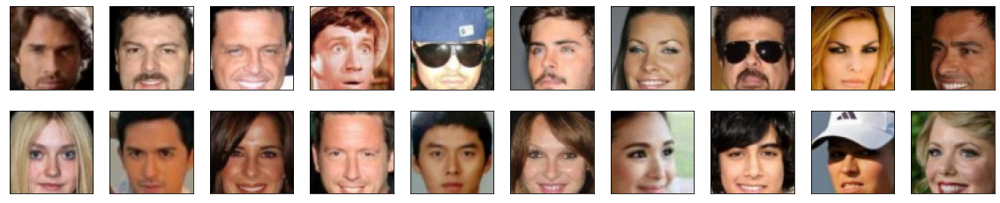

In [6]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def denormalize(images):
    """Transform images from [-1.0, 1.0] to [0, 255] and cast them to uint8."""
    return ((images + 1.) / 2. * 255).astype(np.uint8)

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
    img = dataset[idx].numpy()
    img = np.transpose(img, (1, 2, 0))
    img = denormalize(img)
    ax.imshow(img)

## Model implementation

As you know, a GAN is comprised of two adversarial networks, a discriminator and a generator. Now that we have a working data pipeline, we need to implement the discriminator and the generator. 

Feel free to implement any additional class or function.

### Exercise: Create the discriminator

The discriminator's job is to score real and fake images. You have two constraints here:
* the discriminator takes as input a **batch of 64x64x3 images**
* the output should be a single value (=score)

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips
* To scale down from the input image, you can either use `Conv2d` layers with the correct hyperparameters or Pooling layers.
* If you plan on using gradient penalty, do not use Batch Normalization layers in the discriminator.

In [7]:
from torch.nn import Module
import torch.nn as nn

Since the dataset is more complex, we need a deeper network to accurately generate new image that seems be like the original dataset. Here we'll use a series of convolutional or transpose convolutional layers in the discriminator and generator. Also, it's also necessary to use batch normalization to get these convolutional networks to train.

In training process, discriminator will alternate on real and fake(generated) images, and the genrator will aim  to trick the discriminator into thinking that it'ss generated images are real.

The discriminator is a convolutional classifier without any maxpooling layers. There's will be a few convolutional, hidden layers. Then a fully connected layer for the output, here in order to have a single value as output, we want a sigmoid output. We'll add that in the loss function __BCEWithLogitsLoss__

__Helper `ConvBlock` module__  
Each layer will be something like convolution -> batch norm -> leaky ReLU, so we'll define a custom torch Module to put these layers together. The module will build a sequential series of a convolutional + optional batch norm layer

In [8]:
class ConvBlock(Module):
    """
    A convolutional block is made of 3 layers: Conv -> BatchNorm -> Activation
    args:
    - in_channel: number of channels in the input to the conv layer
    - out_channel: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - batch_norm: whether to use batc norm or not
    """
    def __init__(self, in_channels: int, out_channels: int, kernel_size: int, batch_norm: bool=True):
        super(ConvBlock, self).__init__()
        
        self.conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride=2, padding=1, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.LeakyReLU(0.2)
    
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.conv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        
        return x

In [9]:
class Discriminator(Module):
    """
    The discriminator model adapted from the DCGAN pepar
    """
    def __init__(self):
        super(Discriminator, self).__init__()
        # TODO: instantiate the different layers
        self.conv_dim = 64
        
        # 64x64 input
        self.conv1 = ConvBlock(3, self.conv_dim, 4, batch_norm=False) # first layer, no batch_norm
        # 32x32 out
        self.conv2 = ConvBlock(self.conv_dim, self.conv_dim*2, 4)
        # 16x16 output
        self.conv3 = ConvBlock(self.conv_dim*2, self.conv_dim*4, 4)
        # 8x8 output
        self.conv4 = ConvBlock(self.conv_dim*4, self.conv_dim*8, 4)
        # 4x4 out
        self.conv5 = ConvBlock(self.conv_dim*8, self.conv_dim*16, 4)
        # 2x2 output
        self.conv6 = ConvBlock(self.conv_dim*16, 1, 4, batch_norm=False)
        # 1x1 output
        
        # flatten layer
#         self.flatten = nn.Flatten()
        # final, fully connected layer
#         self.fc = nn.Linear(self.conv_dim*16*2*2, 1)
        
        # sigmoid output
#         self.sigmoid = nn.Sigmoid()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        # all hidden layers + leaky relu activation
        x = self.conv1(x)
#         print('conv1 size: ', x.size())
        x = self.conv2(x)
#         print('conv2 size: ', x.size())
        x = self.conv3(x)
#         print('conv3 size: ', x.size())
        x = self.conv4(x)
#         print('conv4 size: ', x.size())
        x = self.conv5(x)
#         print('conv5 size: ', x.size())
        x = self.conv6(x)
#         print('conv6 size: ', x.size())

        # flatten
#         x = self.flatten(x)
#         print('flatten size: ', x.size())
#         print('flatten: ', x)
#         final output layer
#         x = self.fc(x)
#         print('fc size: ', x.size())
#         print('fc: ', x)
        
        # sigmoid output
#         x = self.sigmoid(x)
#         print('sigmoid size: ', x.size())

        return x 

In [10]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to check your discriminator implementation
discriminator = Discriminator()
tests.check_discriminator(discriminator)

Congrats, your discriminator implementation passed all the tests


### Exercise: create the generator

The generator's job creates the "fake images" and learns the dataset distribution. You have three constraints here:
* the generator takes as input a vector of dimension `[batch_size, latent_dimension, 1, 1]`
* the generator must outputs **64x64x3 images** -> 1, 3, 64, 64

Feel free to get inspiration from the different architectures we talked about in the course, such as DCGAN, WGAN-GP or DRAGAN.

#### Some tips:
* to scale up from the latent vector input, you can use `ConvTranspose2d` layers
* as often with Gan, **Batch Normalization** helps with training

The input for generator will be noise vector z. The first layer is a fully connected layer which is reshaped into a deep and narrow layer, then we use batch normalization and a leaky ReLU activation, next is a series of transpose convolutional layers where you typically halve the depth and double the height of the previous layer. We'll apply batch normalization and ReLU to all but the last of these hidden layers. The last layer will just use tanh activation

__Helper `DeconvBlock` module__  
For each of these layers, the general scheme is transpose convolution -> batch norm -> ReLU, so we'll define function to put these layers together. This function will create a sequential series of a transpose convolutional + optional batch norm layer. 

In [11]:
class DeconvBlock(Module):
    """
    A "de-convolutional" block is made of 3 layers: ConvTranspose -> BatchNorm -> Activation
    args:
    - in_channels: number of channels in the input to the conv layer
    - out_channels: number of filters in the conv layer
    - kernel_size: filter dimension of the conv layer
    - stride: stride of the conv layer
    - padding: padding of the conv layer
    - batch_norm: whether to use batch norm or not
    """
    def __init__(self,
                in_channels: int,
                out_channels: int,
                kernel_size: int,
                stride: int,
                padding: int,
                batch_norm: bool=True):
        super(DeconvBlock, self).__init__()
        self.deconv = nn.ConvTranspose2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
        self.batch_norm = batch_norm
        if self.batch_norm:
            self.bn = nn.BatchNorm2d(out_channels)
        self.activation = nn.ReLU()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        x = self.deconv(x)
        if self.batch_norm:
            x = self.bn(x)
        x = self.activation(x)
        return x

In [12]:
class Generator(Module):
    def __init__(self, latent_dim: int):
        super(Generator, self).__init__()
        # TODO: instantiate the different layers
        # transpose cconv layer
        self.conv_dim = 64
        
#         self.fc2 = nn.Linear(latent_dim, conv_dim*4*4*4)
        
        self.deconv1 = DeconvBlock(latent_dim, self.conv_dim*8, 4, 1, 0)
        self.deconv2 = DeconvBlock(self.conv_dim*8, self.conv_dim*4, 4, 2, 1)
        self.deconv3 = DeconvBlock(self.conv_dim*4, self.conv_dim*2, 4, 2, 1)
        self.deconv4 = DeconvBlock(self.conv_dim*2, self.conv_dim, 4, 2, 1)
        self.deconv5 = nn.ConvTranspose2d(self.conv_dim, 3, 4, stride=2, padding=1)
        self.last_activation = nn.Tanh()
        
    def forward(self, x: torch.Tensor) -> torch.Tensor:
        # TODO: implement the forward method
        x = self.deconv1(x)
#         print('deconv1 size: ', x.size())
        x = self.deconv2(x)
#         print('deconv2 size: ', x.size())
        x = self.deconv3(x)
#         print('deconv3 size: ', x.size())
        x = self.deconv4(x)
#         print('deconv4 size: ', x.size())
        x = self.deconv5(x)
#         print('deconv5 size: ', x.size())
        x = self.last_activation(x)
#         print('last_activation: ', x.size())

        return x

In [13]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
# run this cell to verify your generator implementation
latent_dim = 128
generator = Generator(latent_dim)
tests.check_generator(generator, latent_dim)

Congrats, your generator implementation passed all the tests


## Optimizer

In the following section, we create the optimizers for the generator and discriminator. You may want to experiment with different optimizers, learning rates and other hyperparameters as they tend to impact the output quality.

### Exercise: implement the optimizers

In [14]:
import torch.optim as optim

def create_optimizers(generator: Module, discriminator: Module):
    """ This function should return the optimizers of the generator and the discriminator """
    # TODO: implement the generator and discriminator optimizers
    lr = 0.0002
    beta1 = 0.5
    beta2 = 0.999 # default value
    
    g_optimizer = optim.Adam(generator.parameters(), lr, [beta1, beta2])
    d_optimizer = optim.Adam(discriminator.parameters(), lr, [beta1, beta2])
    return g_optimizer, d_optimizer

## Losses implementation

In this section, we are going to implement the loss function for the generator and the discriminator. You can and should experiment with different loss function.

Some tips:
* You can choose the commonly used the binary cross entropy loss or select other losses we have discovered in the course, such as the Wasserstein distance.
* You may want to implement a gradient penalty function as discussed in the course. It is not required and the code will work whether you implement it or not.

### Exercise: implement the generator loss

The generator's goal is to get the discriminator to think its generated images (= "fake" images) are real.

In [15]:
def generator_loss(fake_logits, smooth=False):
    """ Generator loss, takes the fake scores as inputs. """
    # TODO: implement the generator loss 
    batch_size = fake_logits.size(0)
    # label smoothing
    if smooth:     
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) 
    # move labels to GPU if available
    if device == 'cuda':
        labels = labels.to(device) 
    
    # Binary cross entropy with logits loss - BCEWithLogitsLoss function
    criterion = nn.BCEWithLogitsLoss()
    # calculate loss
    loss = criterion(fake_logits.squeeze(), labels)
    
    return loss

### Exercise: implement the discriminator loss

We want the discriminator to give high scores to real images and low scores to fake ones and the discriminator loss should reflect that.

In [16]:
def discriminator_loss(real_logits, fake_logits, smooth=False):
    """ Discriminator loss, takes the fake and real logits as inputs. """
    # TODO: implement the discriminator loss 
    # Real losses
    batch_size = real_logits.size(0)
    # label smoothing
    if smooth:    
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size) 
    # move labels to GPU if available
    if device == 'cuda':
        labels = labels.to(device)
    
    # Binary cross entropy with logits loss - BCEWithLogitsLoss function
    criterion = nn.BCEWithLogitsLoss()
    real_loss = criterion(real_logits.squeeze(), labels)
    
    # Fake losses
    batch_size_f = fake_logits.size(0)   
    labels_f = torch.zeros(batch_size_f).to(device)  
    # move labels to GPU if available
    if device == 'cuda':
        labels_f = labels_f.to(device)
    fake_loss = criterion(fake_logits.squeeze(), labels_f)
    
    # add up feal and fake loss
    loss = real_loss + fake_loss
    
    return loss

### Exercise (Optional): Implement the gradient Penalty

In the course, we discussed the importance of gradient penalty in training certain types of Gans. Implementing this function is not required and depends on some of the design decision you made (discriminator architecture, loss functions).

In [17]:
def gradient_penalty(discriminator, real_samples, fake_samples):
    """ This function enforces """
    gp = 0
    # TODO (Optional): implement the gradient penalty
    return gp

## Training


Training will involve alternating between training the discriminator and the generator. You'll use your functions real_loss and fake_loss to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function

### Exercise: implement the generator step and the discriminator step functions

Each function should do the following:
* calculate the loss
* backpropagate the gradient
* perform one optimizer step

In [18]:
def generator_step(batch_size: int, latent_dim: int, g_optimizer, generator, discriminator) -> Dict:
    """ One training step of the generator. """
    # TODO: implement the generator step (foward pass, loss calculation and backward pass)
    g_optimizer.zero_grad()
    
    # generate fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    # move to GPU if available
    if device == 'cuda':
        z = z.to(device)
    fake_images = generator(z)
    fake_logits = discriminator(fake_images)
    
    # calculate discriminator losses on fake images
    g_loss = generator_loss(fake_logits, smooth=False)
    g_loss.backward()
    g_optimizer.step()
    
    return {'loss': g_loss}

def discriminator_step(batch_size: int, latent_dim: int, real_images: torch.Tensor, d_optimizer, generator, discriminator) -> Dict:
    """ One training step of the discriminator. """
    # TODO: implement the discriminator step (foward pass, loss calculation and backward pass)
    d_optimizer.zero_grad()
    
    ## train with real images
    # move to GPU if available
    if device == 'cuda':
        real_images = real_images.to(device)
    
    real_logits = discriminator(real_images)
    
    ## train with fake images
    z = np.random.uniform(-1, 1, size=(batch_size, latent_dim, 1, 1))
    z = torch.from_numpy(z).float()
    # move to GPU if available
    if device == 'cuda':
        z = z.to(device)
    fake_images = generator(z)
    fake_logits = discriminator(fake_images.detach())
    
    # add up loss
    d_loss = discriminator_loss(real_logits, fake_logits, smooth=False)
    d_loss.backward()
    d_optimizer.step()
    
    return {'loss': d_loss}

### Main training loop

You don't have to implement anything here but you can experiment with different hyperparameters.

In [19]:
from datetime import datetime

In [20]:
# you can experiment with different dimensions of latent spaces
latent_dim = 128

# update to cpu if you do not have access to a gpu
device = 'cuda'

# number of epochs to train your model
n_epochs = 20

# number of images in each batch
batch_size = 64

In [21]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
print_every = 50

# Create optimizers for the discriminator D and generator G
generator = Generator(latent_dim).to(device)
discriminator = Discriminator().to(device)
g_optimizer, d_optimizer = create_optimizers(generator, discriminator)

dataloader = DataLoader(dataset, 
                        batch_size=64, 
                        shuffle=True, 
                        num_workers=4, 
                        drop_last=True,
                        pin_memory=False)

In [22]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""

def display(fixed_latent_vector: torch.Tensor):
    """ helper function to display images during training """
    fig = plt.figure(figsize=(14, 4))
    plot_size = 16
    for idx in np.arange(plot_size):
        ax = fig.add_subplot(2, int(plot_size/2), idx+1, xticks=[], yticks=[])
        img = fixed_latent_vector[idx, ...].detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = denormalize(img)
        ax.imshow(img)
    plt.show()

### Exercise: implement the training strategy

You should experiment with different training strategies. For example:

* train the generator more often than the discriminator. 
* added noise to the input image
* use label smoothing

Implement with your training strategy below.

2023-03-10 12:48:03 | Epoch [1/20] | Batch 0/509 | d_loss: 1.3916 | g_loss: 0.9674
2023-03-10 12:48:27 | Epoch [1/20] | Batch 50/509 | d_loss: 0.0795 | g_loss: 3.6547
2023-03-10 12:48:52 | Epoch [1/20] | Batch 100/509 | d_loss: 0.5664 | g_loss: 1.3345
2023-03-10 12:49:17 | Epoch [1/20] | Batch 150/509 | d_loss: 1.7045 | g_loss: 1.1773
2023-03-10 12:49:42 | Epoch [1/20] | Batch 200/509 | d_loss: 0.7159 | g_loss: 0.8974
2023-03-10 12:50:07 | Epoch [1/20] | Batch 250/509 | d_loss: 0.8469 | g_loss: 0.7936
2023-03-10 12:50:57 | Epoch [1/20] | Batch 350/509 | d_loss: 1.2729 | g_loss: 0.6843
2023-03-10 12:51:23 | Epoch [1/20] | Batch 400/509 | d_loss: 1.2105 | g_loss: 0.9637
2023-03-10 12:51:48 | Epoch [1/20] | Batch 450/509 | d_loss: 1.5664 | g_loss: 1.2729
2023-03-10 12:52:13 | Epoch [1/20] | Batch 500/509 | d_loss: 1.3239 | g_loss: 0.9770


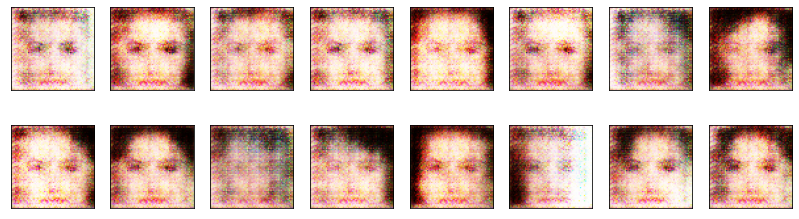

2023-03-10 12:52:19 | Epoch [2/20] | Batch 0/509 | d_loss: 1.3792 | g_loss: 0.8461
2023-03-10 12:52:44 | Epoch [2/20] | Batch 50/509 | d_loss: 0.8320 | g_loss: 0.7921
2023-03-10 12:53:09 | Epoch [2/20] | Batch 100/509 | d_loss: 1.3377 | g_loss: 0.7636
2023-03-10 12:53:34 | Epoch [2/20] | Batch 150/509 | d_loss: 1.3166 | g_loss: 0.8360
2023-03-10 12:53:59 | Epoch [2/20] | Batch 200/509 | d_loss: 0.9787 | g_loss: 0.7452
2023-03-10 12:54:25 | Epoch [2/20] | Batch 250/509 | d_loss: 1.3982 | g_loss: 0.8396
2023-03-10 12:54:50 | Epoch [2/20] | Batch 300/509 | d_loss: 1.4718 | g_loss: 1.7150
2023-03-10 12:55:15 | Epoch [2/20] | Batch 350/509 | d_loss: 1.2557 | g_loss: 1.0114
2023-03-10 12:55:40 | Epoch [2/20] | Batch 400/509 | d_loss: 1.3918 | g_loss: 0.7845
2023-03-10 12:56:06 | Epoch [2/20] | Batch 450/509 | d_loss: 1.3787 | g_loss: 0.7383
2023-03-10 12:56:31 | Epoch [2/20] | Batch 500/509 | d_loss: 1.2642 | g_loss: 0.7660


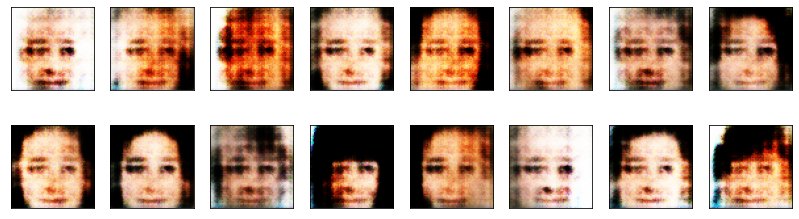

2023-03-10 12:56:36 | Epoch [3/20] | Batch 0/509 | d_loss: 1.3109 | g_loss: 1.4970
2023-03-10 12:57:02 | Epoch [3/20] | Batch 50/509 | d_loss: 1.2870 | g_loss: 1.0979
2023-03-10 12:57:27 | Epoch [3/20] | Batch 100/509 | d_loss: 1.3880 | g_loss: 0.8326
2023-03-10 12:57:52 | Epoch [3/20] | Batch 150/509 | d_loss: 1.3094 | g_loss: 0.8756
2023-03-10 12:58:17 | Epoch [3/20] | Batch 200/509 | d_loss: 0.4944 | g_loss: 1.3259
2023-03-10 12:58:42 | Epoch [3/20] | Batch 250/509 | d_loss: 1.4250 | g_loss: 0.8301
2023-03-10 12:59:08 | Epoch [3/20] | Batch 300/509 | d_loss: 1.3836 | g_loss: 0.7946
2023-03-10 12:59:33 | Epoch [3/20] | Batch 350/509 | d_loss: 1.1964 | g_loss: 0.7400
2023-03-10 12:59:58 | Epoch [3/20] | Batch 400/509 | d_loss: 1.2113 | g_loss: 1.1567
2023-03-10 13:00:23 | Epoch [3/20] | Batch 450/509 | d_loss: 0.8426 | g_loss: 0.9787
2023-03-10 13:00:48 | Epoch [3/20] | Batch 500/509 | d_loss: 1.3972 | g_loss: 0.9742


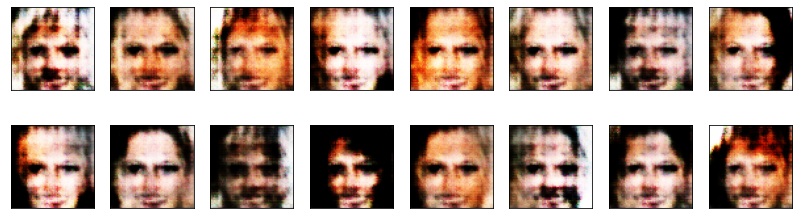

2023-03-10 13:00:54 | Epoch [4/20] | Batch 0/509 | d_loss: 0.7604 | g_loss: 0.9945
2023-03-10 13:01:19 | Epoch [4/20] | Batch 50/509 | d_loss: 0.7365 | g_loss: 1.0627
2023-03-10 13:01:44 | Epoch [4/20] | Batch 100/509 | d_loss: 1.3252 | g_loss: 0.6879
2023-03-10 13:02:09 | Epoch [4/20] | Batch 150/509 | d_loss: 1.3052 | g_loss: 0.8426
2023-03-10 13:02:35 | Epoch [4/20] | Batch 200/509 | d_loss: 1.0120 | g_loss: 1.0206
2023-03-10 13:03:00 | Epoch [4/20] | Batch 250/509 | d_loss: 1.2837 | g_loss: 1.2050
2023-03-10 13:03:25 | Epoch [4/20] | Batch 300/509 | d_loss: 1.1097 | g_loss: 0.6283
2023-03-10 13:03:50 | Epoch [4/20] | Batch 350/509 | d_loss: 1.3291 | g_loss: 0.7066
2023-03-10 13:04:15 | Epoch [4/20] | Batch 400/509 | d_loss: 0.7981 | g_loss: 0.8270
2023-03-10 13:04:40 | Epoch [4/20] | Batch 450/509 | d_loss: 1.4237 | g_loss: 0.8556
2023-03-10 13:05:06 | Epoch [4/20] | Batch 500/509 | d_loss: 1.2173 | g_loss: 1.1577


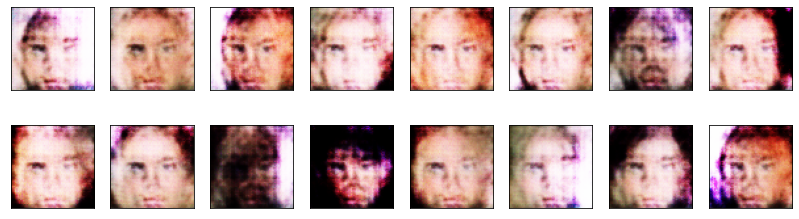

2023-03-10 13:05:11 | Epoch [5/20] | Batch 0/509 | d_loss: 1.2916 | g_loss: 1.2624
2023-03-10 13:05:36 | Epoch [5/20] | Batch 50/509 | d_loss: 1.0004 | g_loss: 0.7517
2023-03-10 13:06:02 | Epoch [5/20] | Batch 100/509 | d_loss: 1.5709 | g_loss: 1.2608
2023-03-10 13:06:27 | Epoch [5/20] | Batch 150/509 | d_loss: 1.4203 | g_loss: 0.8085
2023-03-10 13:06:52 | Epoch [5/20] | Batch 200/509 | d_loss: 1.4095 | g_loss: 1.0338
2023-03-10 13:07:17 | Epoch [5/20] | Batch 250/509 | d_loss: 1.4514 | g_loss: 0.8039
2023-03-10 13:07:42 | Epoch [5/20] | Batch 300/509 | d_loss: 1.0489 | g_loss: 0.7975
2023-03-10 13:08:07 | Epoch [5/20] | Batch 350/509 | d_loss: 0.7754 | g_loss: 1.1257
2023-03-10 13:08:33 | Epoch [5/20] | Batch 400/509 | d_loss: 1.0955 | g_loss: 1.2250
2023-03-10 13:08:58 | Epoch [5/20] | Batch 450/509 | d_loss: 0.6610 | g_loss: 1.2924
2023-03-10 13:09:23 | Epoch [5/20] | Batch 500/509 | d_loss: 1.1165 | g_loss: 1.6296


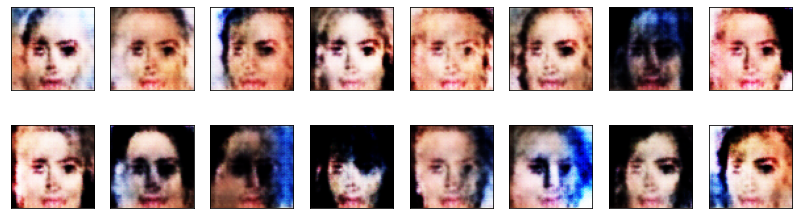

2023-03-10 13:09:29 | Epoch [6/20] | Batch 0/509 | d_loss: 1.2582 | g_loss: 1.5483
2023-03-10 13:09:54 | Epoch [6/20] | Batch 50/509 | d_loss: 1.4052 | g_loss: 0.7608
2023-03-10 13:10:19 | Epoch [6/20] | Batch 100/509 | d_loss: 1.2711 | g_loss: 0.7165
2023-03-10 13:10:44 | Epoch [6/20] | Batch 150/509 | d_loss: 0.8483 | g_loss: 0.9072
2023-03-10 13:11:09 | Epoch [6/20] | Batch 200/509 | d_loss: 0.7941 | g_loss: 0.8965
2023-03-10 13:11:35 | Epoch [6/20] | Batch 250/509 | d_loss: 1.4787 | g_loss: 0.8288
2023-03-10 13:12:00 | Epoch [6/20] | Batch 300/509 | d_loss: 0.5913 | g_loss: 1.0161
2023-03-10 13:12:25 | Epoch [6/20] | Batch 350/509 | d_loss: 1.1832 | g_loss: 0.6729
2023-03-10 13:12:50 | Epoch [6/20] | Batch 400/509 | d_loss: 0.9880 | g_loss: 0.7585
2023-03-10 13:13:15 | Epoch [6/20] | Batch 450/509 | d_loss: 1.1088 | g_loss: 0.7906
2023-03-10 13:13:40 | Epoch [6/20] | Batch 500/509 | d_loss: 1.4221 | g_loss: 0.7992


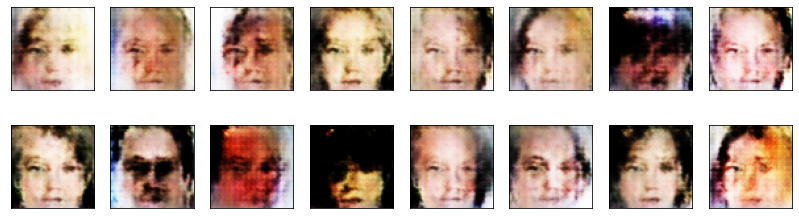

2023-03-10 13:13:46 | Epoch [7/20] | Batch 0/509 | d_loss: 1.3947 | g_loss: 0.7924
2023-03-10 13:14:11 | Epoch [7/20] | Batch 50/509 | d_loss: 0.7010 | g_loss: 0.9058
2023-03-10 13:14:36 | Epoch [7/20] | Batch 100/509 | d_loss: 1.1602 | g_loss: 0.7425
2023-03-10 13:15:02 | Epoch [7/20] | Batch 150/509 | d_loss: 1.4666 | g_loss: 1.5039
2023-03-10 13:15:27 | Epoch [7/20] | Batch 200/509 | d_loss: 0.9832 | g_loss: 0.9365
2023-03-10 13:15:52 | Epoch [7/20] | Batch 250/509 | d_loss: 1.3098 | g_loss: 0.8067
2023-03-10 13:16:17 | Epoch [7/20] | Batch 300/509 | d_loss: 0.6565 | g_loss: 1.0680
2023-03-10 13:16:42 | Epoch [7/20] | Batch 350/509 | d_loss: 0.6245 | g_loss: 1.0205
2023-03-10 13:17:07 | Epoch [7/20] | Batch 400/509 | d_loss: 1.5462 | g_loss: 0.8893
2023-03-10 13:17:33 | Epoch [7/20] | Batch 450/509 | d_loss: 1.4963 | g_loss: 1.2186
2023-03-10 13:17:58 | Epoch [7/20] | Batch 500/509 | d_loss: 1.3952 | g_loss: 0.7745


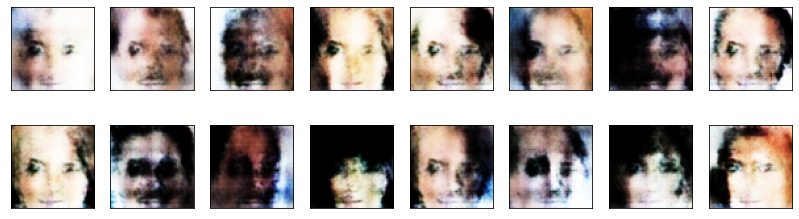

2023-03-10 13:18:03 | Epoch [8/20] | Batch 0/509 | d_loss: 1.0587 | g_loss: 0.6526
2023-03-10 13:18:29 | Epoch [8/20] | Batch 50/509 | d_loss: 1.0488 | g_loss: 0.7974
2023-03-10 13:18:54 | Epoch [8/20] | Batch 100/509 | d_loss: 0.5186 | g_loss: 1.2718
2023-03-10 13:19:19 | Epoch [8/20] | Batch 150/509 | d_loss: 0.9397 | g_loss: 0.9198
2023-03-10 13:19:44 | Epoch [8/20] | Batch 200/509 | d_loss: 0.9556 | g_loss: 1.9028
2023-03-10 13:20:09 | Epoch [8/20] | Batch 250/509 | d_loss: 1.3900 | g_loss: 0.8538
2023-03-10 13:20:34 | Epoch [8/20] | Batch 300/509 | d_loss: 1.4859 | g_loss: 1.2477
2023-03-10 13:21:00 | Epoch [8/20] | Batch 350/509 | d_loss: 1.3818 | g_loss: 0.8986
2023-03-10 13:21:25 | Epoch [8/20] | Batch 400/509 | d_loss: 0.5648 | g_loss: 0.8651
2023-03-10 13:21:50 | Epoch [8/20] | Batch 450/509 | d_loss: 1.2198 | g_loss: 0.8271
2023-03-10 13:22:15 | Epoch [8/20] | Batch 500/509 | d_loss: 0.9609 | g_loss: 0.8156


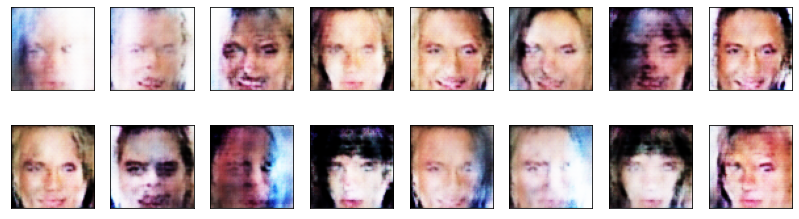

2023-03-10 13:22:21 | Epoch [9/20] | Batch 0/509 | d_loss: 0.7537 | g_loss: 1.1576
2023-03-10 13:22:46 | Epoch [9/20] | Batch 50/509 | d_loss: 1.3966 | g_loss: 1.6661
2023-03-10 13:23:11 | Epoch [9/20] | Batch 100/509 | d_loss: 0.3680 | g_loss: 1.8152
2023-03-10 13:23:37 | Epoch [9/20] | Batch 150/509 | d_loss: 0.4212 | g_loss: 1.2173
2023-03-10 13:24:02 | Epoch [9/20] | Batch 200/509 | d_loss: 1.1405 | g_loss: 0.8543
2023-03-10 13:24:27 | Epoch [9/20] | Batch 250/509 | d_loss: 0.5919 | g_loss: 1.0311
2023-03-10 13:24:52 | Epoch [9/20] | Batch 300/509 | d_loss: 1.1002 | g_loss: 0.9560
2023-03-10 13:25:17 | Epoch [9/20] | Batch 350/509 | d_loss: 1.4804 | g_loss: 1.3248
2023-03-10 13:25:42 | Epoch [9/20] | Batch 400/509 | d_loss: 1.4458 | g_loss: 1.0161
2023-03-10 13:26:08 | Epoch [9/20] | Batch 450/509 | d_loss: 1.3158 | g_loss: 1.4277
2023-03-10 13:26:33 | Epoch [9/20] | Batch 500/509 | d_loss: 1.5582 | g_loss: 1.2177


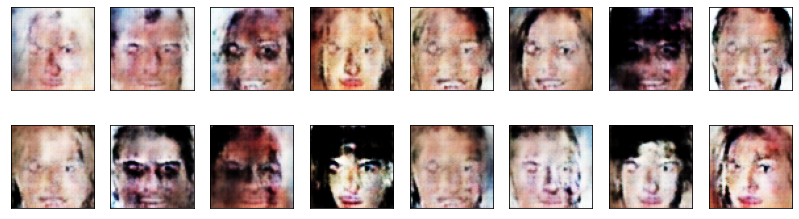

2023-03-10 13:26:38 | Epoch [10/20] | Batch 0/509 | d_loss: 1.3903 | g_loss: 0.8944
2023-03-10 13:27:03 | Epoch [10/20] | Batch 50/509 | d_loss: 1.2731 | g_loss: 0.8853
2023-03-10 13:27:29 | Epoch [10/20] | Batch 100/509 | d_loss: 1.0698 | g_loss: 0.7789
2023-03-10 13:27:54 | Epoch [10/20] | Batch 150/509 | d_loss: 0.5555 | g_loss: 1.0170
2023-03-10 13:28:19 | Epoch [10/20] | Batch 200/509 | d_loss: 1.2533 | g_loss: 0.8672
2023-03-10 13:28:44 | Epoch [10/20] | Batch 250/509 | d_loss: 0.6242 | g_loss: 1.0650
2023-03-10 13:29:09 | Epoch [10/20] | Batch 300/509 | d_loss: 0.4862 | g_loss: 1.1813
2023-03-10 13:29:35 | Epoch [10/20] | Batch 350/509 | d_loss: 0.9945 | g_loss: 0.8523
2023-03-10 13:30:00 | Epoch [10/20] | Batch 400/509 | d_loss: 0.4484 | g_loss: 1.4003
2023-03-10 13:30:25 | Epoch [10/20] | Batch 450/509 | d_loss: 1.4300 | g_loss: 0.9668
2023-03-10 13:30:50 | Epoch [10/20] | Batch 500/509 | d_loss: 1.0967 | g_loss: 0.8384


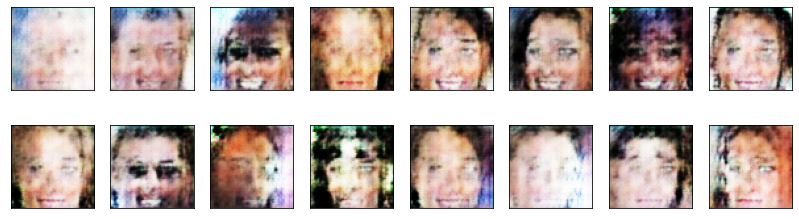

2023-03-10 13:30:56 | Epoch [11/20] | Batch 0/509 | d_loss: 0.7899 | g_loss: 0.8093
2023-03-10 13:31:21 | Epoch [11/20] | Batch 50/509 | d_loss: 0.6662 | g_loss: 0.8284
2023-03-10 13:31:46 | Epoch [11/20] | Batch 100/509 | d_loss: 1.0423 | g_loss: 1.7121
2023-03-10 13:32:11 | Epoch [11/20] | Batch 150/509 | d_loss: 1.3416 | g_loss: 1.6631
2023-03-10 13:32:36 | Epoch [11/20] | Batch 200/509 | d_loss: 1.2491 | g_loss: 0.7468
2023-03-10 13:33:02 | Epoch [11/20] | Batch 250/509 | d_loss: 1.6653 | g_loss: 1.6482
2023-03-10 13:33:27 | Epoch [11/20] | Batch 300/509 | d_loss: 0.3729 | g_loss: 1.4316
2023-03-10 13:33:52 | Epoch [11/20] | Batch 350/509 | d_loss: 0.1158 | g_loss: 2.4605
2023-03-10 13:34:17 | Epoch [11/20] | Batch 400/509 | d_loss: 0.0690 | g_loss: 2.7402
2023-03-10 13:34:42 | Epoch [11/20] | Batch 450/509 | d_loss: 1.0691 | g_loss: 0.7503
2023-03-10 13:35:07 | Epoch [11/20] | Batch 500/509 | d_loss: 0.9211 | g_loss: 0.9580


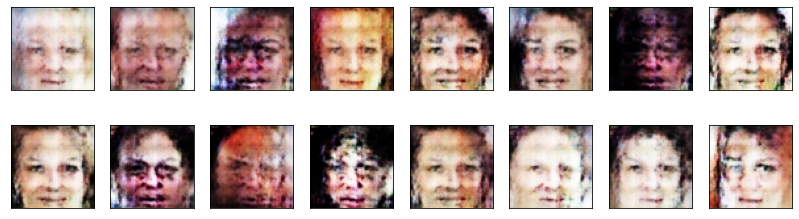

2023-03-10 13:35:13 | Epoch [12/20] | Batch 0/509 | d_loss: 0.8523 | g_loss: 1.3416
2023-03-10 13:35:38 | Epoch [12/20] | Batch 50/509 | d_loss: 0.5894 | g_loss: 1.4971
2023-03-10 13:36:03 | Epoch [12/20] | Batch 100/509 | d_loss: 0.5204 | g_loss: 1.1449
2023-03-10 13:36:29 | Epoch [12/20] | Batch 150/509 | d_loss: 0.5920 | g_loss: 0.8663
2023-03-10 13:36:54 | Epoch [12/20] | Batch 200/509 | d_loss: 0.9950 | g_loss: 0.8512
2023-03-10 13:37:19 | Epoch [12/20] | Batch 250/509 | d_loss: 0.3643 | g_loss: 1.3201
2023-03-10 13:37:44 | Epoch [12/20] | Batch 300/509 | d_loss: 1.2521 | g_loss: 0.6926
2023-03-10 13:38:09 | Epoch [12/20] | Batch 350/509 | d_loss: 0.8940 | g_loss: 0.7645
2023-03-10 13:38:34 | Epoch [12/20] | Batch 400/509 | d_loss: 0.6794 | g_loss: 1.0806
2023-03-10 13:38:59 | Epoch [12/20] | Batch 450/509 | d_loss: 0.5560 | g_loss: 1.4031
2023-03-10 13:39:25 | Epoch [12/20] | Batch 500/509 | d_loss: 0.7920 | g_loss: 0.8609


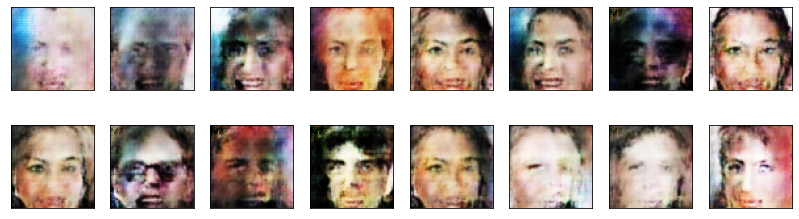

2023-03-10 13:39:30 | Epoch [13/20] | Batch 0/509 | d_loss: 0.6930 | g_loss: 0.9595
2023-03-10 13:39:55 | Epoch [13/20] | Batch 50/509 | d_loss: 1.6300 | g_loss: 1.7780
2023-03-10 13:40:21 | Epoch [13/20] | Batch 100/509 | d_loss: 0.5197 | g_loss: 1.3417
2023-03-10 13:40:46 | Epoch [13/20] | Batch 150/509 | d_loss: 0.1756 | g_loss: 1.9547
2023-03-10 13:41:11 | Epoch [13/20] | Batch 200/509 | d_loss: 0.1181 | g_loss: 2.6270
2023-03-10 13:41:36 | Epoch [13/20] | Batch 250/509 | d_loss: 0.0458 | g_loss: 3.4948
2023-03-10 13:42:01 | Epoch [13/20] | Batch 300/509 | d_loss: 0.0510 | g_loss: 3.2114
2023-03-10 13:42:26 | Epoch [13/20] | Batch 350/509 | d_loss: 0.2750 | g_loss: 2.1157
2023-03-10 13:42:52 | Epoch [13/20] | Batch 400/509 | d_loss: 0.2084 | g_loss: 2.2309
2023-03-10 13:43:17 | Epoch [13/20] | Batch 450/509 | d_loss: 0.8530 | g_loss: 3.9495
2023-03-10 13:43:42 | Epoch [13/20] | Batch 500/509 | d_loss: 0.0807 | g_loss: 2.8746


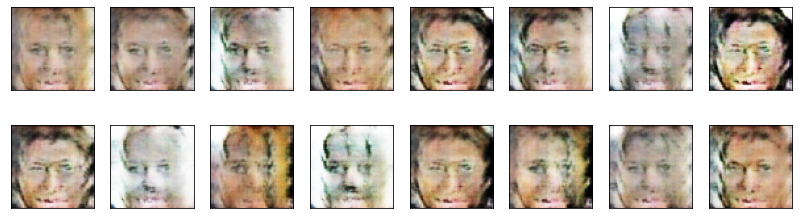

2023-03-10 13:43:47 | Epoch [14/20] | Batch 0/509 | d_loss: 0.2103 | g_loss: 2.3474
2023-03-10 13:44:13 | Epoch [14/20] | Batch 50/509 | d_loss: 3.7128 | g_loss: 3.8362
2023-03-10 13:44:38 | Epoch [14/20] | Batch 100/509 | d_loss: 0.6103 | g_loss: 1.3750
2023-03-10 13:45:03 | Epoch [14/20] | Batch 150/509 | d_loss: 0.4578 | g_loss: 1.4519
2023-03-10 13:45:28 | Epoch [14/20] | Batch 200/509 | d_loss: 0.2848 | g_loss: 1.8368
2023-03-10 13:45:53 | Epoch [14/20] | Batch 250/509 | d_loss: 1.5050 | g_loss: 1.1805
2023-03-10 13:46:18 | Epoch [14/20] | Batch 300/509 | d_loss: 0.7868 | g_loss: 1.2895
2023-03-10 13:46:43 | Epoch [14/20] | Batch 350/509 | d_loss: 1.1927 | g_loss: 1.5757
2023-03-10 13:47:09 | Epoch [14/20] | Batch 400/509 | d_loss: 0.4914 | g_loss: 1.7036
2023-03-10 13:47:34 | Epoch [14/20] | Batch 450/509 | d_loss: 0.1336 | g_loss: 2.2235
2023-03-10 13:47:59 | Epoch [14/20] | Batch 500/509 | d_loss: 0.9861 | g_loss: 0.7566


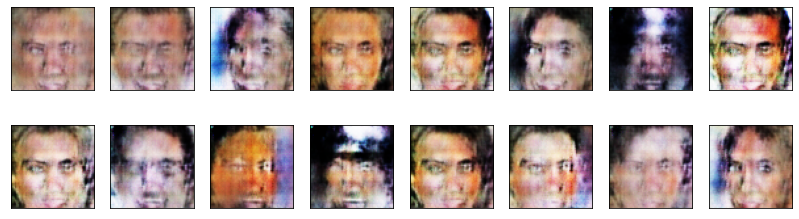

2023-03-10 13:48:05 | Epoch [15/20] | Batch 0/509 | d_loss: 0.7177 | g_loss: 0.8342
2023-03-10 13:48:30 | Epoch [15/20] | Batch 50/509 | d_loss: 0.7036 | g_loss: 1.2932
2023-03-10 13:48:55 | Epoch [15/20] | Batch 100/509 | d_loss: 0.5852 | g_loss: 1.1118
2023-03-10 13:49:20 | Epoch [15/20] | Batch 150/509 | d_loss: 0.2529 | g_loss: 2.0226
2023-03-10 13:49:45 | Epoch [15/20] | Batch 200/509 | d_loss: 0.5878 | g_loss: 1.2062
2023-03-10 13:50:10 | Epoch [15/20] | Batch 250/509 | d_loss: 0.9820 | g_loss: 1.5139
2023-03-10 13:50:36 | Epoch [15/20] | Batch 300/509 | d_loss: 1.1688 | g_loss: 1.6250
2023-03-10 13:51:01 | Epoch [15/20] | Batch 350/509 | d_loss: 0.3948 | g_loss: 1.5880
2023-03-10 13:51:26 | Epoch [15/20] | Batch 400/509 | d_loss: 0.1429 | g_loss: 2.4494
2023-03-10 13:51:51 | Epoch [15/20] | Batch 450/509 | d_loss: 0.5323 | g_loss: 1.2258
2023-03-10 13:52:16 | Epoch [15/20] | Batch 500/509 | d_loss: 0.2684 | g_loss: 1.7231


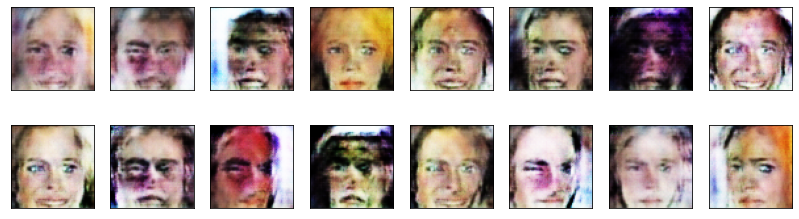

2023-03-10 13:52:22 | Epoch [16/20] | Batch 0/509 | d_loss: 0.3022 | g_loss: 1.8685
2023-03-10 13:52:47 | Epoch [16/20] | Batch 50/509 | d_loss: 1.2569 | g_loss: 0.7258
2023-03-10 13:53:12 | Epoch [16/20] | Batch 100/509 | d_loss: 0.9144 | g_loss: 1.4772
2023-03-10 13:53:37 | Epoch [16/20] | Batch 150/509 | d_loss: 0.7539 | g_loss: 1.5141
2023-03-10 13:54:02 | Epoch [16/20] | Batch 200/509 | d_loss: 1.4017 | g_loss: 2.0694
2023-03-10 13:54:28 | Epoch [16/20] | Batch 250/509 | d_loss: 0.3823 | g_loss: 1.3923
2023-03-10 13:54:53 | Epoch [16/20] | Batch 300/509 | d_loss: 0.2998 | g_loss: 1.8165
2023-03-10 13:55:18 | Epoch [16/20] | Batch 350/509 | d_loss: 2.6692 | g_loss: 2.5895
2023-03-10 13:55:43 | Epoch [16/20] | Batch 400/509 | d_loss: 0.5783 | g_loss: 0.9540
2023-03-10 13:56:08 | Epoch [16/20] | Batch 450/509 | d_loss: 1.2272 | g_loss: 1.1324
2023-03-10 13:56:34 | Epoch [16/20] | Batch 500/509 | d_loss: 0.4390 | g_loss: 1.1963


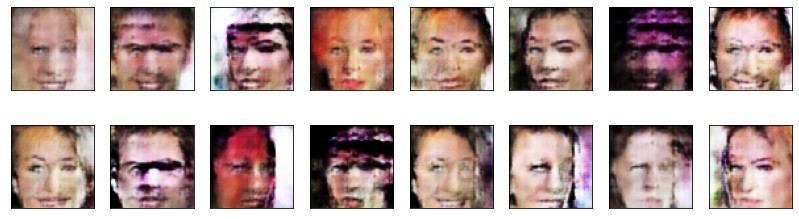

2023-03-10 13:56:39 | Epoch [17/20] | Batch 0/509 | d_loss: 1.8760 | g_loss: 2.4297
2023-03-10 13:57:04 | Epoch [17/20] | Batch 50/509 | d_loss: 0.3557 | g_loss: 1.7679
2023-03-10 13:57:29 | Epoch [17/20] | Batch 100/509 | d_loss: 1.6655 | g_loss: 1.6135
2023-03-10 13:57:55 | Epoch [17/20] | Batch 150/509 | d_loss: 0.7399 | g_loss: 1.0266
2023-03-10 13:58:20 | Epoch [17/20] | Batch 200/509 | d_loss: 0.7732 | g_loss: 1.4161
2023-03-10 13:58:45 | Epoch [17/20] | Batch 250/509 | d_loss: 0.4902 | g_loss: 1.9259
2023-03-10 13:59:10 | Epoch [17/20] | Batch 300/509 | d_loss: 0.8074 | g_loss: 1.0994
2023-03-10 13:59:35 | Epoch [17/20] | Batch 350/509 | d_loss: 0.2879 | g_loss: 1.4580
2023-03-10 14:00:00 | Epoch [17/20] | Batch 400/509 | d_loss: 0.4105 | g_loss: 1.2857
2023-03-10 14:00:26 | Epoch [17/20] | Batch 450/509 | d_loss: 0.2047 | g_loss: 1.8704
2023-03-10 14:00:51 | Epoch [17/20] | Batch 500/509 | d_loss: 0.6002 | g_loss: 0.9680


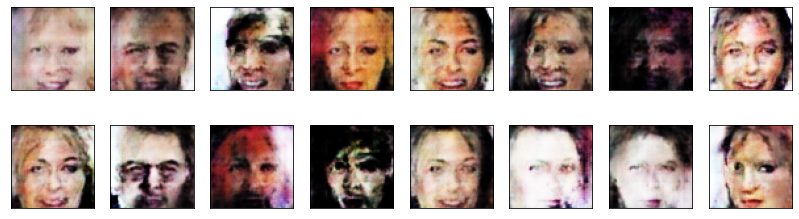

2023-03-10 14:00:56 | Epoch [18/20] | Batch 0/509 | d_loss: 0.5707 | g_loss: 1.0879
2023-03-10 14:01:21 | Epoch [18/20] | Batch 50/509 | d_loss: 0.1998 | g_loss: 1.7653
2023-03-10 14:01:46 | Epoch [18/20] | Batch 100/509 | d_loss: 1.4791 | g_loss: 1.1951
2023-03-10 14:02:11 | Epoch [18/20] | Batch 150/509 | d_loss: 0.7021 | g_loss: 1.0180
2023-03-10 14:02:37 | Epoch [18/20] | Batch 200/509 | d_loss: 0.2388 | g_loss: 1.8946
2023-03-10 14:03:02 | Epoch [18/20] | Batch 250/509 | d_loss: 3.0390 | g_loss: 2.9187
2023-03-10 14:03:27 | Epoch [18/20] | Batch 300/509 | d_loss: 0.5725 | g_loss: 1.1173
2023-03-10 14:03:52 | Epoch [18/20] | Batch 350/509 | d_loss: 1.4871 | g_loss: 1.1492
2023-03-10 14:04:17 | Epoch [18/20] | Batch 400/509 | d_loss: 0.6858 | g_loss: 1.0937
2023-03-10 14:04:42 | Epoch [18/20] | Batch 450/509 | d_loss: 0.9622 | g_loss: 0.6966
2023-03-10 14:05:07 | Epoch [18/20] | Batch 500/509 | d_loss: 0.4033 | g_loss: 1.5344


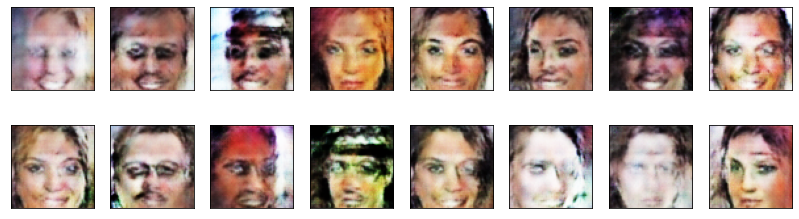

2023-03-10 14:05:13 | Epoch [19/20] | Batch 0/509 | d_loss: 0.2590 | g_loss: 1.5331
2023-03-10 14:05:38 | Epoch [19/20] | Batch 50/509 | d_loss: 0.3199 | g_loss: 1.6390
2023-03-10 14:06:03 | Epoch [19/20] | Batch 100/509 | d_loss: 0.3941 | g_loss: 2.5264
2023-03-10 14:06:28 | Epoch [19/20] | Batch 150/509 | d_loss: 1.1799 | g_loss: 0.7295
2023-03-10 14:06:53 | Epoch [19/20] | Batch 200/509 | d_loss: 1.1234 | g_loss: 0.6428
2023-03-10 14:07:18 | Epoch [19/20] | Batch 250/509 | d_loss: 1.9086 | g_loss: 1.9642
2023-03-10 14:07:43 | Epoch [19/20] | Batch 300/509 | d_loss: 0.8301 | g_loss: 1.0969
2023-03-10 14:08:09 | Epoch [19/20] | Batch 350/509 | d_loss: 0.4725 | g_loss: 1.3103
2023-03-10 14:08:34 | Epoch [19/20] | Batch 400/509 | d_loss: 1.4056 | g_loss: 2.0909
2023-03-10 14:08:59 | Epoch [19/20] | Batch 450/509 | d_loss: 0.1485 | g_loss: 2.3447
2023-03-10 14:09:24 | Epoch [19/20] | Batch 500/509 | d_loss: 0.7383 | g_loss: 1.0993


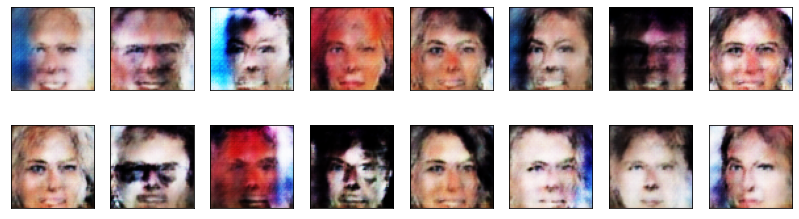

2023-03-10 14:09:30 | Epoch [20/20] | Batch 0/509 | d_loss: 1.4516 | g_loss: 2.2277
2023-03-10 14:09:55 | Epoch [20/20] | Batch 50/509 | d_loss: 0.4297 | g_loss: 1.2898
2023-03-10 14:10:20 | Epoch [20/20] | Batch 100/509 | d_loss: 0.1326 | g_loss: 2.3838
2023-03-10 14:10:45 | Epoch [20/20] | Batch 150/509 | d_loss: 1.4242 | g_loss: 1.8572
2023-03-10 14:11:10 | Epoch [20/20] | Batch 200/509 | d_loss: 0.2350 | g_loss: 1.8671
2023-03-10 14:11:36 | Epoch [20/20] | Batch 250/509 | d_loss: 1.2388 | g_loss: 0.7485
2023-03-10 14:12:01 | Epoch [20/20] | Batch 300/509 | d_loss: 0.9303 | g_loss: 0.9766
2023-03-10 14:12:26 | Epoch [20/20] | Batch 350/509 | d_loss: 1.7913 | g_loss: 1.7577
2023-03-10 14:12:51 | Epoch [20/20] | Batch 400/509 | d_loss: 0.3686 | g_loss: 1.3922
2023-03-10 14:13:16 | Epoch [20/20] | Batch 450/509 | d_loss: 1.2092 | g_loss: 1.5719
2023-03-10 14:13:42 | Epoch [20/20] | Batch 500/509 | d_loss: 0.3139 | g_loss: 1.6156


In [ ]:
fixed_latent_vector = torch.randn(16, latent_dim, 1, 1).float().cuda()

losses = []
# keep track of loss and generated, "fake" samples
samples = []

for epoch in range(n_epochs):
    for batch_i, real_images in enumerate(dataloader):
        real_images = real_images.to(device)
        
        ####################################
        
        # TODO: implement the training strategy
        
        ####################################
        
        # train the discriminator
        d_loss = discriminator_step(batch_size, latent_dim, real_images, d_optimizer, generator, discriminator)
        
        
        # train the generator
        g_loss = generator_step(batch_size, latent_dim, g_optimizer, generator, discriminator)

        if batch_i % print_every == 0:
            # append discriminator loss and generator loss
            d = d_loss['loss'].item()
            g = g_loss['loss'].item()
            losses.append((d, g))
            # print discriminator and generator loss
            time = str(datetime.now()).split('.')[0]
            print(f'{time} | Epoch [{epoch+1}/{n_epochs}] | Batch {batch_i}/{len(dataloader)} | d_loss: {d:.4f} | g_loss: {g:.4f}')
    
    # display images during training
    generator.eval()
    # generate and save sample, fake images
    generated_images = generator(fixed_latent_vector)
    display(generated_images)
    samples.append(generated_images)
    generator.train() # back to training mode
    
# Save training generator samples
with open('train_samples.pkl', 'wb') as f:
    pkl.dump(samples, f)


### Training losses

Plot the training losses for the generator and discriminator.

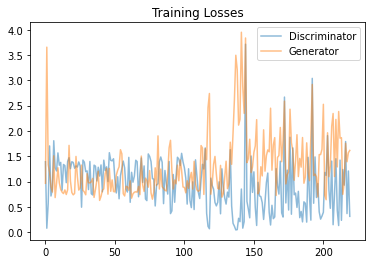

In [28]:
"""
DO NOT MODIFY ANYTHING IN THIS CELL
"""
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

### Generator samples from training
View samples of images from the generator, and answer a question about the strengths and weaknesses of your trained models.

In [29]:
# helper function for viewing a list of passed in sample images
def view_samples(epoch, samples):
    fig, axes = plt.subplots(figsize=(16,4), nrows=2, ncols=8, sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = ((img + 1)*255 / (2)).astype(np.uint8)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        im = ax.imshow(img.reshape((64,64,3)))

In [30]:
# Load samples from generator, taken while training
with open('train_samples.pkl', 'rb') as f:
    samples = pkl.load(f)

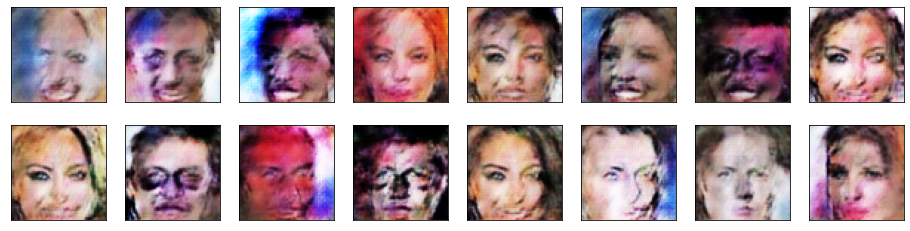

In [31]:
_ = view_samples(-1, samples)

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result
* Loss functions

**Answer:** (Write your answer in this cell)
1. The generated samples are blur and low quality. We can only see the rough sketch of people but missing the details of people's face. It seems the model only learned limited part of the features that represent the celebrity faces.
2. To improve:
    - Include more diversity into the dataset instead of having most of data are white people. In this way, we can fix some bias in the dataset
    - Try to build deeper model with more hidden layers, usually the deeper the model the more it can learn. Also, we can try some different combination of different kinds of layer
    - Explore options of hidden layer like dropout, different activation function, or relularization to improve the performance
    - Tune parameters of activation function like 0.2 of LeakyReLU
    - Try different loss function like Wasserstein Ditance
    - Can definitely try different GAN, for example, like GAN-GP, ProGAN, StyleGAN (this time we didn't implement the gradient penalties
    - We can also explore more optimizer like SGD optimizer for discriminator and ADAM for generator


### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb".  

Submit the notebook using the ***SUBMIT*** button in the bottom right corner of the Project Workspace.